# Exploring batch effects in the LINCS L1000 data

---


## _Zichen Wang, Avi Ma'ayan_

<img src="http://lincs-dcic.org/images/dcic-logo/DCIC_500x375_cropped.png" style="float: right; width: 100px;"/>

#### BD2K-LINCS Data Coordination and Integration Center (DCIC)<br>Mount Sinai Center for Bioinformatics<br>Icahn School of Medicine at Mount Sinai, New York, NY<br>Grant # U54HL127624

#### CMap Workshop - Dec. 4-6, 2018 

---

## Table of Contents

1. [Explore the batch effects in the Level 3 data](#1.-Explore-batch-effects-in-the-Level-3-data)
1. [Explore the batch effects in the Level 5 data](#2.-Batch-effects-in-the-Level-5-data)
    + Approaches for visualizing and quantifying the batch effects
    + Benchmarks for batch effect correction methods for the Level 5 data, comparing different computational pipelines
    
1. [Visualizing Level 5 signatures](#3.-Interactive-visualization-of-the-signatures)
    + Interactive scatter plots
    + Graph-based dimensionality reduction methods
    
---

In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
# Set paths to find the data required
## paths on jupyter.clue.io
DATA_DIR = '/srv/data/workshop/data/common'
DATA_MODULE3_DIR = '/srv/data/workshop/data/Module3'

## paths on my desktop
# DATA_DIR = '/Volumes/Untitled/Zichen_Projects/LINCS_L1000_GSE92742_data/data/'
# DATA_MODULE3_DIR = '/Volumes/Untitled/Zichen_Projects/LINCS_L1000_GSE92742_data/data/'

In [4]:
from __future__ import print_function, division
import os, sys
import warnings
warnings.filterwarnings("ignore")
import h5py
import numpy as np
import pandas as pd
from sklearn import decomposition, manifold, metrics
np.random.seed(2018)

%matplotlib inline
import seaborn as sns
sns.set(context='talk', style='whitegrid')

In [5]:
import plots
import gctx_utils

---
# 1. Explore batch effects in the Level 3 data

**Level 3 (Q2NORM)**: contains the gene expression profiles of both directly measured landmark transcripts plus inferred genes. This data is normalized using invariant set scaling followed by quantile normalization.

The data files can be downloaded from GEO at: [GSE92742](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE92742)

In [6]:
!ls -lh /srv/data/workshop/data/common/

total 83G
-rwxrwxrwx 1 root root  61G Nov 29 10:23 GSE92742_Broad_LINCS_Level3_INF_mlr12k_n1319138x12328.gctx
-rw-r--r-- 1 root root  22G Nov 13 18:37 GSE92742_Broad_LINCS_Level5_COMPZ.MODZ_n473647x12328.gctx
-rw-r--r-- 1 root root  12K Nov 13 18:40 GSE92742_Broad_LINCS_cell_info.txt
-rw-r--r-- 1 root root 608K Nov 13 18:40 GSE92742_Broad_LINCS_gene_info.txt
-rw-r--r-- 1 root root 142M Nov 13 18:39 GSE92742_Broad_LINCS_inst_info.txt
-rw-r--r-- 1 root root 4.6M Nov 13 18:39 GSE92742_Broad_LINCS_pert_info.txt
-rw-r--r-- 1 root root 2.8M Nov 13 18:39 GSE92742_Broad_LINCS_pert_metrics.txt
-rw-r--r-- 1 root root 101M Nov 13 18:38 GSE92742_Broad_LINCS_sig_info.txt
-rw-r--r-- 1 root root  49M Nov 13 18:38 GSE92742_Broad_LINCS_sig_metrics.txt


In [7]:
# Level 3 data
gctx3 = h5py.File('%s/GSE92742_Broad_LINCS_Level3_INF_mlr12k_n1319138x12328.gctx' % DATA_DIR, 'r')

## 1.1. Parsing the metadata 
- Mapping genes
- Mapping instances: corresponds to a well on the 386-well plate

In [8]:
gene_info_df = pd.read_csv('%s/GSE92742_Broad_LINCS_gene_info.txt' % DATA_DIR, 
                          sep='\t')
gene_info_df.set_index(gene_info_df.columns[0], inplace=True)
gene_info_df.index = gene_info_df.index.astype(str)
print(gene_info_df.shape)
gene_info_df.head()

(12328, 4)


,pr_gene_symbol,pr_gene_title,pr_is_lm,pr_is_bing
pr_gene_id,,,,
780,DDR1,discoidin domain receptor tyrosine kinase 1,1,1
7849,PAX8,paired box 8,1,1
2978,GUCA1A,guanylate cyclase activator 1A,0,0
2049,EPHB3,EPH receptor B3,0,1
2101,ESRRA,estrogen related receptor alpha,0,1


In [9]:
# Get the Landmark 1000 genes
LM_GENE_IDS = gene_info_df.query('pr_is_lm == 1').index
LM_GENE_IDS = LM_GENE_IDS.values.astype(np.str) # convert to np.array with np.str as dtype
print(len(LM_GENE_IDS))

978


In [10]:
# Metadata of instances
inst_info_df = pd.read_csv('%s/GSE92742_Broad_LINCS_inst_info.txt' % DATA_DIR, 
                          sep='\t')
inst_info_df.set_index(inst_info_df.columns[0], inplace=True)
print(inst_info_df.shape)
inst_info_df.head()

(1319138, 10)


,rna_plate,rna_well,pert_id,pert_iname,pert_type,pert_dose,pert_dose_unit,pert_time,pert_time_unit,cell_id
inst_id,,,,,,,,,,
ASG001_MCF7_24H_X1_B7_DUO52HI53LO:F13,ASG001_MCF7_24H_X1,F13,DMSO,DMSO,ctl_vehicle,0.1,%,24,h,MCF7
ASG001_MCF7_24H_X1_B7_DUO52HI53LO:G13,ASG001_MCF7_24H_X1,G13,DMSO,DMSO,ctl_vehicle,0.1,%,24,h,MCF7
ASG001_MCF7_24H_X1_B7_DUO52HI53LO:I13,ASG001_MCF7_24H_X1,I13,DMSO,DMSO,ctl_vehicle,0.1,%,24,h,MCF7
ASG001_MCF7_24H_X1_B7_DUO52HI53LO:K13,ASG001_MCF7_24H_X1,K13,DMSO,DMSO,ctl_vehicle,0.1,%,24,h,MCF7
ASG001_MCF7_24H_X1_B7_DUO52HI53LO:N13,ASG001_MCF7_24H_X1,N13,DMSO,DMSO,ctl_vehicle,0.1,%,24,h,MCF7


In [11]:
inst_info_df['pert_type'].value_counts()

trt_cp         672128
trt_sh         448737
trt_oe          87765
ctl_vector      30400
ctl_vehicle     28463
trt_lig         25739
ctl_untrt       22072
trt_oe.mut       3834
Name: pert_type, dtype: int64

Select compount treatment (`trt_cp`) and their controls (`ctr_vehicle`)

In [12]:
inst_info_df = inst_info_df.loc[inst_info_df['pert_type'].isin(['trt_cp', 'ctl_vehicle'])]
print(inst_info_df.shape)

(700591, 10)


In [13]:
# Find the top cell lines
inst_info_df['cell_id'].value_counts().head(10)

VCAP      125539
MCF7      103448
PC3        96014
A549       60622
A375       54971
HT29       53436
HA1E       32613
HCC515     27449
HEPG2      19019
NPC        15060
Name: cell_id, dtype: int64

In [14]:
# Only examine samples from PC3 cell line
# but you can select any other cell lines
inst_info_df = inst_info_df.query('cell_id == "PC3"')
# inst_info_df = inst_info_df.query('cell_id == "NPC"')
inst_info_df.shape

(96014, 10)

In [15]:
inst_info_df.pert_type.value_counts()

trt_cp         91954
ctl_vehicle     4060
Name: pert_type, dtype: int64

In [16]:
inst_info_df.rna_plate.value_counts().head()

PCLB001_PC3_24H_X1    1055
CPC009_PC3_6H_X3       736
CPC006_PC3_24H_X2      731
CPC019_PC3_24H_X1      728
CPC001_PC3_24H_X3      721
Name: rna_plate, dtype: int64

In [17]:
inst_info_df.query('pert_type =="ctl_vehicle"')['rna_plate'].value_counts().head()

RAD001_PC3_6H_X2       36
PRISM001_PC3_24H_X1    36
DEB001_PC3_6H_X2.A2    36
PRISM001_PC3_6H_X1     34
ERG015_PC3_6H_X1       32
Name: rna_plate, dtype: int64

In [18]:
# Extract pert_plate and det_plate from the instance_id
inst_info_df['batch'] = inst_info_df['rna_plate'].map(lambda x: '_'.join(x.split('_')[:3]))
inst_info_df['pert_plate'] = inst_info_df['rna_plate'].map(lambda x: x.split('_')[0])
inst_info_df['det_plate'] = inst_info_df.index.map(lambda x: x.split(':')[0])

In [19]:
inst_ids_pclb = inst_info_df.loc[inst_info_df['batch'].isin(['CPC001_PC3_24H', 'CPC006_PC3_24H'])]
# inst_ids_pclb = inst_info_df.loc[inst_info_df['batch'].isin(['CPC018_NPC_24H', 'CPC012_NPC_24H'])]
inst_ids_pclb.shape

(4389, 13)

In [20]:
inst_ids_pclb['rna_plate'].value_counts()

CPC006_PC3_24H_X2    731
CPC001_PC3_24H_X3    721
CPC001_PC3_24H_X4    375
CPC001_PC3_24H_X2    368
CPC001_PC3_24H_X5    368
CPC006_PC3_24H_X3    367
CPC006_PC3_24H_X5    367
CPC006_PC3_24H_X1    366
CPC001_PC3_24H_X1    363
CPC006_PC3_24H_X4    363
Name: rna_plate, dtype: int64

In [21]:
inst_ids_pclb['det_plate'].value_counts()

CPC001_PC3_24H_X4_F2B4_DUO52HI53LO    375
CPC001_PC3_24H_X2_B3_DUO52HI53LO      368
CPC001_PC3_24H_X5_B5_DUO52HI53LO      368
CPC006_PC3_24H_X3_F1B3_DUO52HI53LO    367
CPC001_PC3_24H_X3_F1B3_DUO52HI53LO    367
CPC006_PC3_24H_X5_B4_DUO52HI53LO      367
CPC006_PC3_24H_X2_B4_DUO52HI53LO      366
CPC006_PC3_24H_X1_B4_DUO52HI53LO      366
CPC006_PC3_24H_X2_F1B3_DUO52HI53LO    365
CPC001_PC3_24H_X1_B3_DUO52HI53LO      363
CPC006_PC3_24H_X4_B4_DUO52HI53LO      363
CPC001_PC3_24H_X3_B3_DUO52HI53LO      354
Name: det_plate, dtype: int64

## 1.2. Examine different batch effects in the Level 3 data with regards to:

- Perturbagen plate (`pert_plate`, example CPC005): contains aliquots of the treatment perturbagens (e.g., test compounds dissolved in DMSO)

- RNA plate (`rna_plate`, example CPC005_A549_24H_X1): contains perturbagen-treated cells. Also referred to as Lysate plate. These plates are given a name containing descriptions of what is in the plate with the format pert plate_cell line_time point_replicate.

- Detection plate (`det_plate`, example CPC005_A549_24H_X1_B20): contains amplicon (derived from perturbagen-treated cell lysates) that has been hybridized to Luminex beads such that the amplicon levels can be measured by a Luminex scanner. These plates are named the same as the RNA plate name but with the name of the bead batch used for that plate added at the end.

https://clue.io/connectopedia/category/Analytical%20Methods

In [22]:
# Retrieve the slice of the expression matrix from the gctx file
mat = gctx_utils.slice_matrix(gctx3,
                   rids=LM_GENE_IDS,
                   cids=inst_ids_pclb.index.values.astype(np.str)
                   )
mat.shape

(4389, 978)

In [23]:
inst_ids_pclb['pert_type'].value_counts()

trt_cp         4251
ctl_vehicle     138
Name: pert_type, dtype: int64

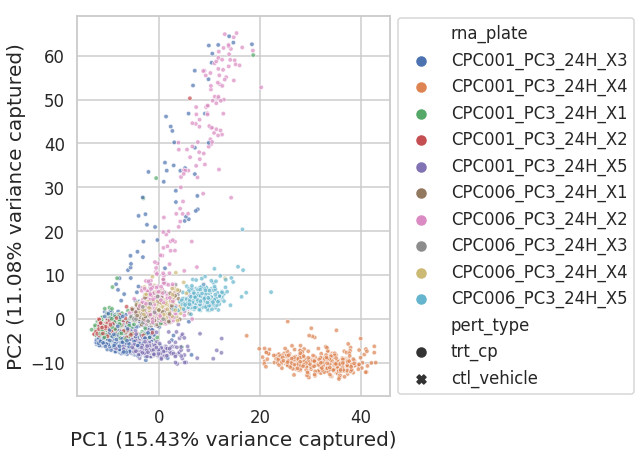

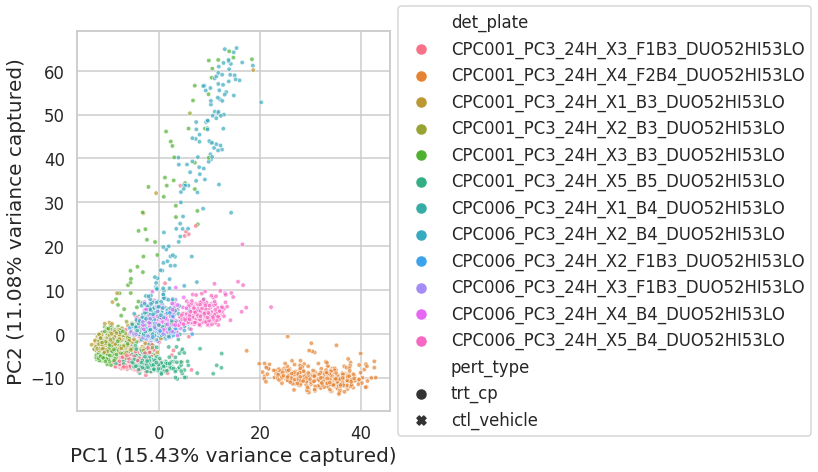

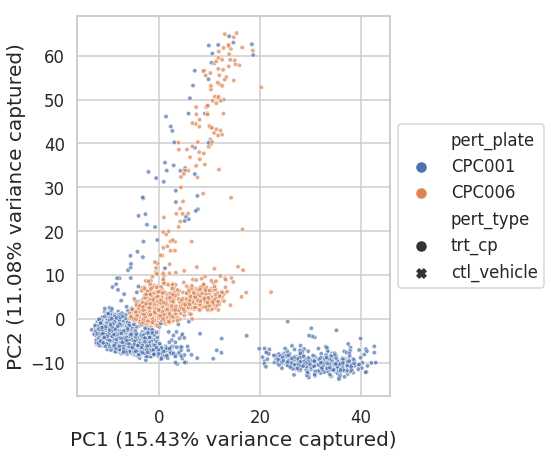

In [24]:
fig = plots.PCA_plot(mat.T, inst_ids_pclb, hue='rna_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat.T, inst_ids_pclb, hue='det_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat.T, inst_ids_pclb, hue='pert_plate', style='pert_type', standardize=3)

## 1.3. Mitigate the batch effects by mean centering within the batches


In [25]:
mat_centered_by_rna = gctx_utils.mean_center(mat, inst_ids_pclb['rna_plate'])

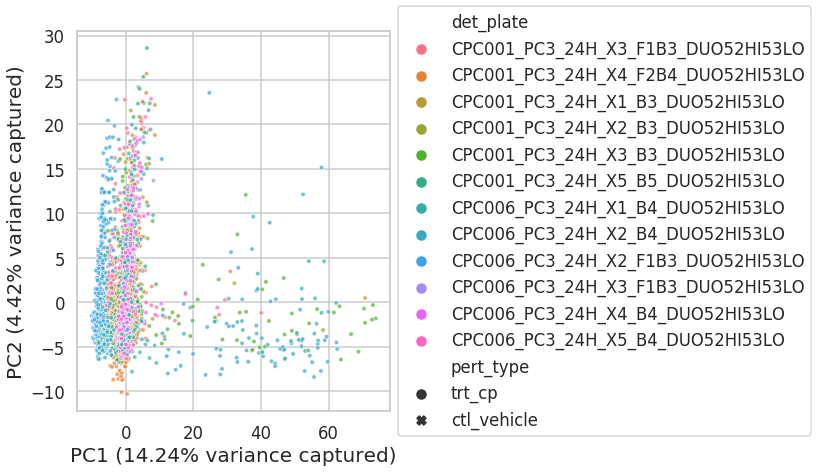

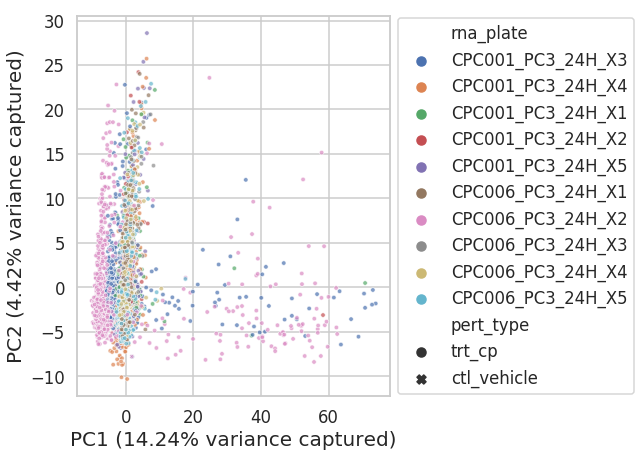

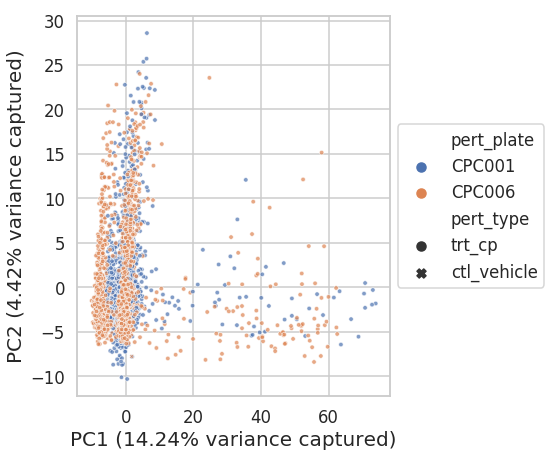

In [26]:
fig = plots.PCA_plot(mat_centered_by_rna.T, inst_ids_pclb, hue='det_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat_centered_by_rna.T, inst_ids_pclb, hue='rna_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat_centered_by_rna.T, inst_ids_pclb, hue='pert_plate', style='pert_type', standardize=3)

In [27]:
mat_centered_by_det = gctx_utils.mean_center(mat, inst_ids_pclb['det_plate'])

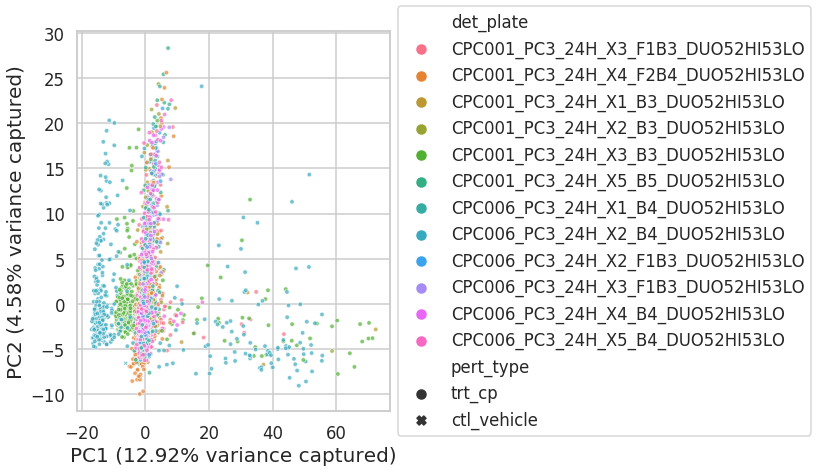

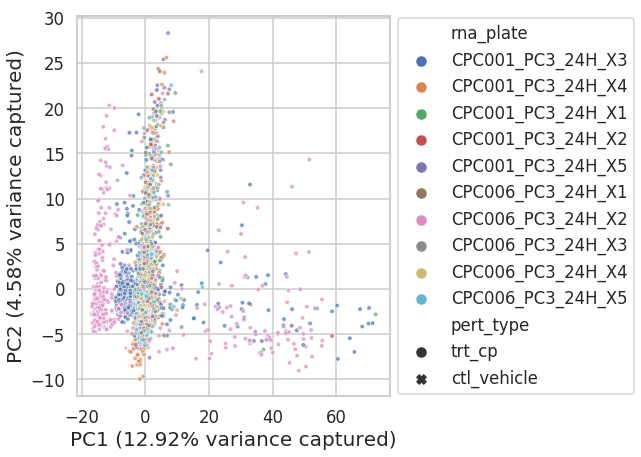

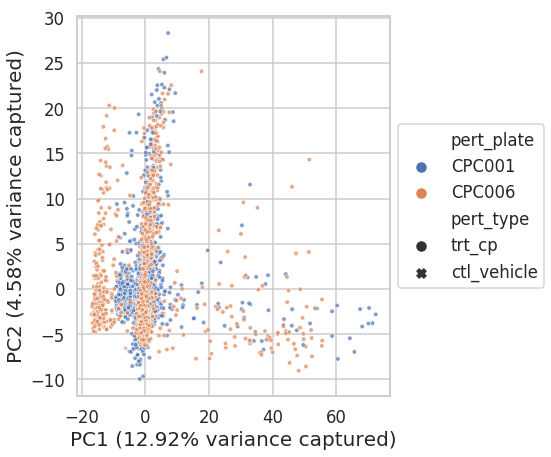

In [28]:
fig = plots.PCA_plot(mat_centered_by_det.T, inst_ids_pclb, hue='det_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat_centered_by_det.T, inst_ids_pclb, hue='rna_plate', style='pert_type', standardize=3)
fig = plots.PCA_plot(mat_centered_by_det.T, inst_ids_pclb, hue='pert_plate', style='pert_type', standardize=3)

## 1.4. More sophisticated methods for batch effect correction to consider are:

- [ComBat](https://academic.oup.com/biostatistics/article/8/1/118/252073): uses empirical Bayes method to estimate the batch effect parameters affecting observed gene expression values.
- [Surrogate Variable Analysis (SVA)](https://bioconductor.org/packages/release/bioc/html/sva.html): uses latent variables (surrogate variable) to model the expression heterogeneity in the data, then adjust the data based on the learned latent variables.
- [Harmony](https://www.biorxiv.org/content/early/2018/11/05/461954): an iterative algorithm to minimize the differences among batches using fuzzy clustering.

# 2. Batch effects in the Level 5 data

The batch effects in Level 3 data could be carried over to the Level 5 signatures if not properly adjusted at Level 3. We next compare Level 5 signatures generated from different computational pipelines and assess their batch effects.

The computational pipelines include:

- MODZ: weighted average of moderated z-scores
- Mean centering + Characteristic Direction (CD) ([Clark et al. (2014) BMC Bioinformatics](http://www.biomedcentral.com/1471-2105/15/79/abstract))
- Mean centering + fold change

## 2.1. Parsing the signature-level metadata

In [29]:
sig_info_df = pd.read_csv('%s/GSE92742_Broad_LINCS_sig_info.txt' % DATA_DIR, 
                          sep='\t')
sig_info_df = sig_info_df.set_index('sig_id')
sig_info_df.shape

(473647, 11)

In [30]:
sig_info_df.head()

,pert_id,pert_iname,pert_type,cell_id,pert_dose,pert_dose_unit,pert_idose,pert_time,pert_time_unit,pert_itime,distil_id
sig_id,,,,,,,,,,,
AML001_CD34_24H:A05,DMSO,DMSO,ctl_vehicle,CD34,0.1,%,0.1 %,24,h,24 h,AML001_CD34_24H_X1_F1B10:A05
AML001_CD34_24H:A06,DMSO,DMSO,ctl_vehicle,CD34,0.1,%,0.1 %,24,h,24 h,AML001_CD34_24H_X3_F1B10:A06
AML001_CD34_24H:B05,DMSO,DMSO,ctl_vehicle,CD34,0.1,%,0.1 %,24,h,24 h,AML001_CD34_24H_X1_F1B10:B05|AML001_CD34_24H_X...
AML001_CD34_24H:B06,DMSO,DMSO,ctl_vehicle,CD34,0.1,%,0.1 %,24,h,24 h,AML001_CD34_24H_X3_F1B10:B06
AML001_CD34_24H:BRD-A03772856:0.37037,BRD-A03772856,BRD-A03772856,trt_cp,CD34,0.37037,µM,500 nM,24,h,24 h,AML001_CD34_24H_X1_F1B10:J04|AML001_CD34_24H_X...


In [31]:
sig_info_df = sig_info_df.query('cell_id == "PC3" & pert_type == "trt_cp"')
# sig_info_df = sig_info_df.query('cell_id == "NPC" & pert_type == "trt_cp"')
print(sig_info_df.shape)

(23123, 11)


In [32]:
sig_info_df['batch'] = sig_info_df.index.map(lambda x: x.split(':')[0])
sig_info_df['pert_plate'] = sig_info_df.batch.map(lambda x: x.split('_')[0])
sig_info_df['n_distil_ids'] = sig_info_df['distil_id'].map(lambda x: len(x.split('|')))

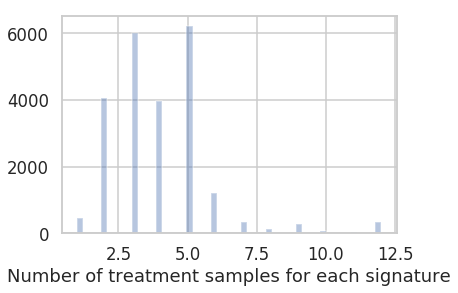

In [33]:
ax = sns.distplot(sig_info_df['n_distil_ids'], kde=False)
ax.set_xlabel('Number of treatment samples for each signature');

In [34]:
# remove signatures with only one distil_id
sig_info_df = sig_info_df.query('n_distil_ids > 1')
sig_info_df.shape

(22664, 14)

In [35]:
sig_info_df['pert_id'].value_counts().head(10)

BRD-K81418486    173
BRD-A75409952    122
BRD-A19037878    121
BRD-A19500257    121
BRD-K27305650     49
BRD-A90490067     42
BRD-K02130563     37
BRD-A13084692     33
BRD-K00627859     32
BRD-K88742110     32
Name: pert_id, dtype: int64

In [36]:
sig_info_df['pert_iname'].value_counts().head(10)

vorinostat        173
wortmannin        126
trichostatin-a    125
geldanamycin      121
LY-294002          49
fulvestrant        49
panobinostat       37
sirolimus          35
troglitazone       33
tubastatin-a       32
Name: pert_iname, dtype: int64

In [37]:
# Only look at the signatures from the top drugs
top10_pert_ids = sig_info_df['pert_id'].value_counts().head(10).index
sig_info_df_sub = sig_info_df.loc[sig_info_df['pert_id'].isin(
    top10_pert_ids
)]
sig_info_df_sub.shape

(762, 14)

## 2.2. Examination of batch effects in the Level 5 data (signatures)

1. Qualitatively and quantitatively inspect the batch effects by tSNE and quality metrics:
    - Adjusted Random Index (ARI): [0, 1]
        + 0 -> random labeling
        + 1 -> identical clusters
    - Adjusted Mutual Information (AMI): [0, 1]
        + 0 -> random labeling
        + 1 -> identical clusters
    
1. Inspect batch effects by examining the distribution of connectivity scores

In [38]:
import benchmarks

In [39]:
gctx5 = h5py.File('%s/GSE92742_Broad_LINCS_Level5_COMPZ.MODZ_n473647x12328.gctx' % DATA_DIR, 'r')

In [40]:
mat5 = gctx_utils.slice_matrix(gctx5, rids=LM_GENE_IDS, 
                               cids=sig_info_df_sub.index.values.astype(np.str))
mat5.shape

(762, 978)

In [41]:
# Load level5 data from CD pipelines with batch effect corrections
gctx5_cd_center = h5py.File('%s/results/CD_center_level5_PC3_n978x22664.gctx' % DATA_MODULE3_DIR, 'r')
mat5_cd_center = gctx_utils.slice_matrix(gctx5_cd_center, rids=LM_GENE_IDS, cids=sig_info_df_sub.index.values.astype(np.str), transpose=True)

gctx5_avg_center = h5py.File('%s/results/Avg_center_level5_PC3_n978x22664.gctx' % DATA_MODULE3_DIR, 'r')
mat5_avg_center = gctx_utils.slice_matrix(gctx5_avg_center, rids=LM_GENE_IDS, cids=sig_info_df_sub.index.values.astype(np.str), transpose=True)
print(mat5_cd_center.shape, mat5_avg_center.shape)

(762, 978) (762, 978)


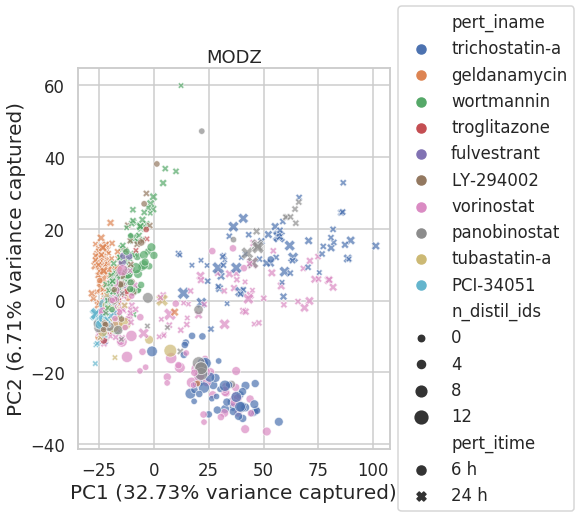

In [42]:
fig = plots.PCA_plot(mat5.T, sig_info_df_sub, hue='pert_iname', style='pert_itime', 
                     size='n_distil_ids',
                     standardize=3)
fig.get_axes()[0].set_title('MODZ');
# We can see nice separation of signatures by the drugs, but this can be further improved.

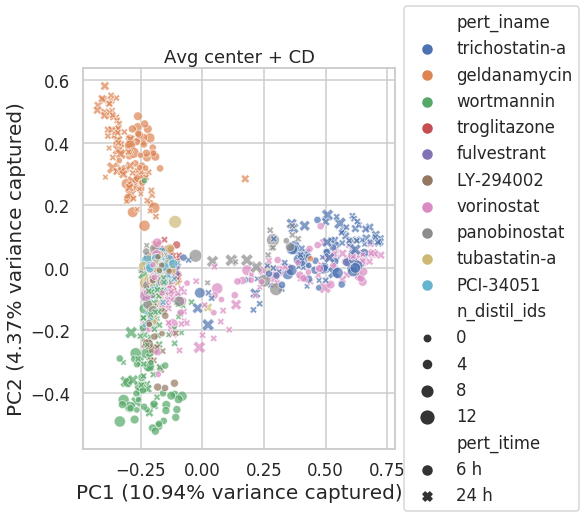

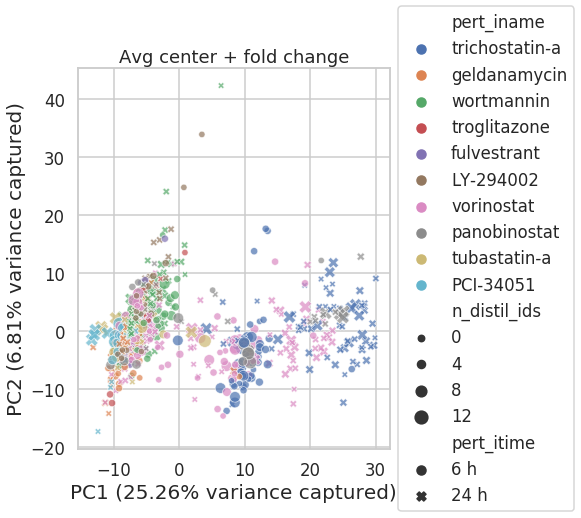

In [43]:
fig = plots.PCA_plot(mat5_cd_center.T, sig_info_df_sub, hue='pert_iname', style='pert_itime', 
                     size='n_distil_ids',
                     standardize=3)
fig.get_axes()[0].set_title('Avg center + CD');

fig = plots.PCA_plot(mat5_avg_center.T, sig_info_df_sub, hue='pert_iname', style='pert_itime', 
                     size='n_distil_ids',
                     standardize=3)
fig.get_axes()[0].set_title('Avg center + fold change');

In [44]:
sig_info_df_sub['pert_plate'].nunique()

47

In [45]:
mat5_tsne, sig_info_df_sub = benchmarks.perform_tsne_and_clustering(mat5, sig_info_df_sub, 
                                                                    sig_name='MODZ')

ARI batch: 0.0457
ARI drug: 0.2549
AMI batch: 0.0997
AMI drug: 0.4018


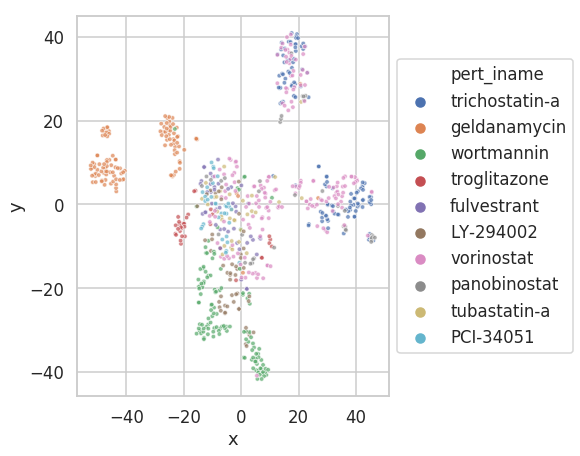

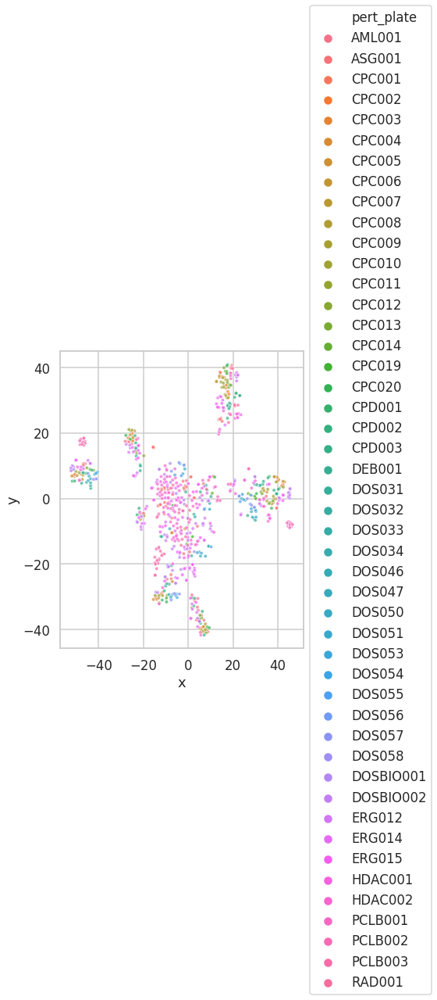

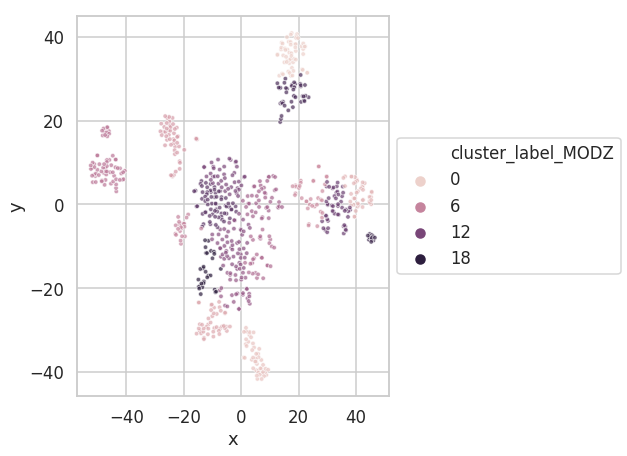

In [46]:
fig = plots.scatter_plot(mat5_tsne, sig_info_df_sub, hue='pert_iname')
fig = plots.scatter_plot(mat5_tsne, sig_info_df_sub, hue='pert_plate')

fig = plots.scatter_plot(mat5_tsne, sig_info_df_sub, hue='cluster_label_MODZ')

print('ARI batch: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_MODZ']))
print('ARI drug: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_MODZ']))

print('AMI batch: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_MODZ']))
print('AMI drug: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_MODZ']))

In [47]:
mat5_cd_center_tsne, sig_info_df_sub = benchmarks.perform_tsne_and_clustering(mat5_cd_center, sig_info_df_sub, 
                                                                  sig_name='CD_center')

ARI batch: 0.0217
ARI drug: 0.2936
AMI batch: 0.0666
AMI drug: 0.4146


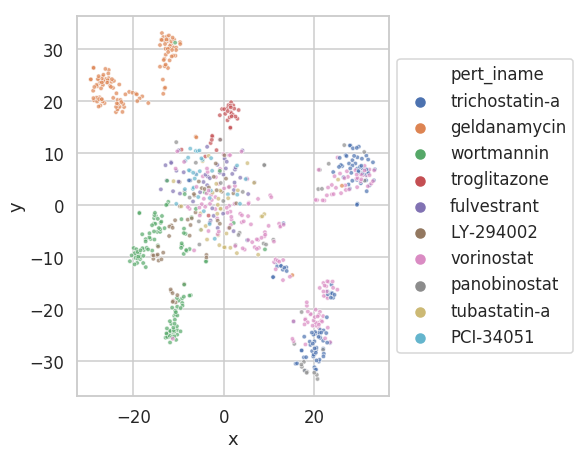

In [48]:
fig = plots.scatter_plot(mat5_cd_center_tsne, sig_info_df_sub, hue='pert_iname')
# fig = plots.scatter_plot(mat5_cd_center_tsne, sig_info_df_sub, hue='pert_plate')

print('ARI batch: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_CD_center']))
print('ARI drug: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_CD_center']))

print('AMI batch: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_CD_center']))
print('AMI drug: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_CD_center']))

In [49]:
mat5_avg_center_tsne, sig_info_df_sub = benchmarks.perform_tsne_and_clustering(mat5_avg_center, sig_info_df_sub, 
                                                                    sig_name='avg_center')

ARI batch: 0.0146
ARI drug: 0.2864
AMI batch: 0.0514
AMI drug: 0.3641


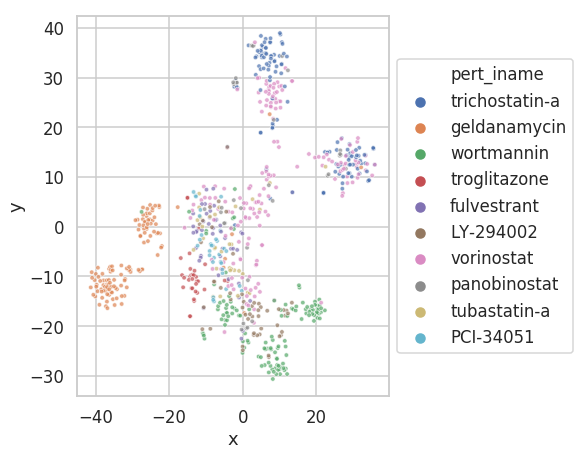

In [50]:
fig = plots.scatter_plot(mat5_avg_center_tsne, sig_info_df_sub, hue='pert_iname')
# fig = plots.scatter_plot(mat5_avg_center_tsne, sig_info_df_sub, hue='pert_plate')

print('ARI batch: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_avg_center']))
print('ARI drug: %.4f'% metrics.adjusted_rand_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_avg_center']))

print('AMI batch: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_plate'], sig_info_df_sub['cluster_label_avg_center']))
print('AMI drug: %.4f'% metrics.adjusted_mutual_info_score(sig_info_df_sub['pert_id'], sig_info_df_sub['cluster_label_avg_center']))

### 2.2.2. Inspect batch effects by examining the distribution of connectivity scores

In [51]:
res_scores = benchmarks.compute_pairwise_connectivity_scores(mat5, sig_info_df_sub, n_jobs=6)

[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 32708 tasks      | elapsed:    2.1s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   16.1s finished
[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 27328 tasks      | elapsed:    1.8s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   16.9s finished


2231 38771 10614 238325


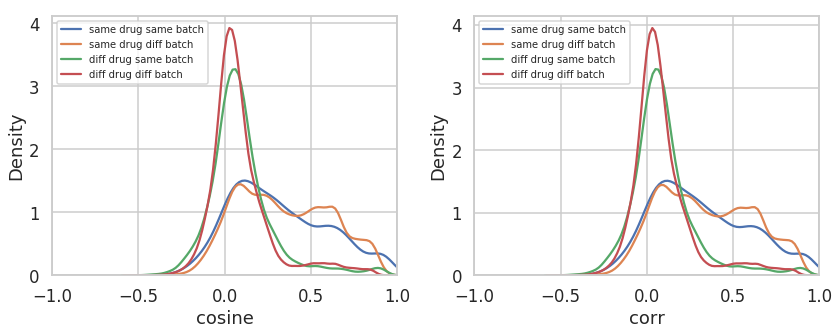

In [52]:
fig = benchmarks.density_plot_scores(res_scores, sig_info_df_sub)

In [53]:
res_scores_cd_center = benchmarks.compute_pairwise_connectivity_scores(mat5_cd_center, sig_info_df_sub, n_jobs=6)

[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 32892 tasks      | elapsed:    2.1s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   15.9s finished
[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 26324 tasks      | elapsed:    1.4s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   12.3s finished


2231 38771 10614 238325


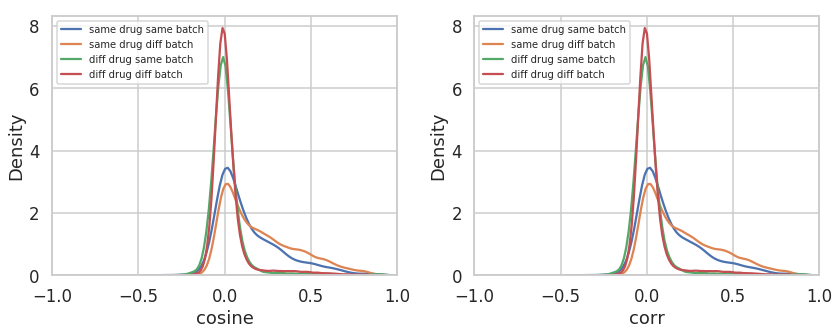

In [54]:
fig = benchmarks.density_plot_scores(res_scores_cd_center, sig_info_df_sub)

In [55]:
res_scores_avg_center = benchmarks.compute_pairwise_connectivity_scores(mat5_avg_center, sig_info_df_sub, n_jobs=6)

[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 27604 tasks      | elapsed:    1.7s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   16.4s finished
[Parallel(n_jobs=6)]: Using backend MultiprocessingBackend with 6 concurrent workers.
[Parallel(n_jobs=6)]: Done 26944 tasks      | elapsed:    1.8s
[Parallel(n_jobs=6)]: Done 289941 out of 289941 | elapsed:   17.2s finished


2231 38771 10614 238325


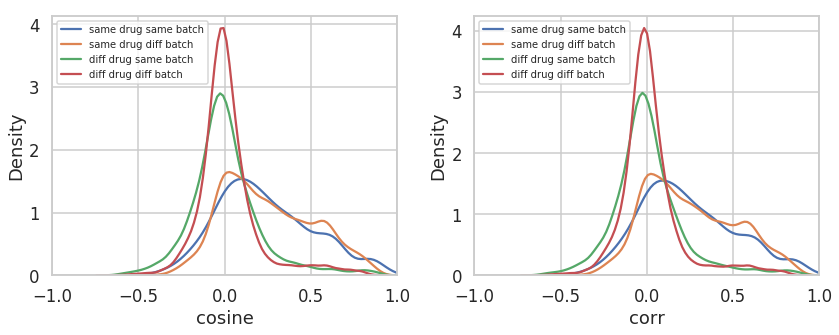

In [56]:
fig = benchmarks.density_plot_scores(res_scores_avg_center, sig_info_df_sub)

# 3. Interactive visualization of the signatures

1. Interactive scatter plots
1. Graph-based dimensionality reduction methods: Overview of the method used to create the [L1000FWD visualizations](http://amp.pharm.mssm.edu/L1000FWD/) ([Wang et al. (2018) _Bioinformatics_](https://doi.org/10.1093/bioinformatics/bty060))   

In [57]:
# Load data downloaded from RepurposingHub
drug_moa_df = pd.read_csv('%s/parsed_Repurposing_Hub.csv' % DATA_MODULE3_DIR).set_index('pert_id')
print(drug_moa_df.shape)
drug_moa_df.head()

(6172, 5)


,Name,MOA,Target,Indication,Phase
pert_id,,,,,
BRD-K38019854,A-317491,purinergic receptor antagonist,P2RX3,NaN,Preclinical
BRD-A40302156,A-33903,NaN,NaN,NaN,Phase 2
BRD-K06182768,A-366,histone lysine methyltransferase inhibitor,"EHMT1, EHMT2",NaN,Preclinical
BRD-K78177893,A-674563,AKT inhibitor,"AKT1, PKIA, PRKACA",NaN,Preclinical
BRD-K03301001,A-7,calmodulin antagonist,NaN,NaN,Preclinical


In [58]:
# Keep signatures from drugs with known MOA/Targets
sig_info_df_known_drugs = sig_info_df.loc[sig_info_df.pert_id.isin(drug_moa_df.index)]
sig_info_df_known_drugs.shape

(6285, 14)

In [59]:
sig_info_df_known_drugs.head()

,pert_id,pert_iname,pert_type,cell_id,pert_dose,pert_dose_unit,pert_idose,pert_time,pert_time_unit,pert_itime,distil_id,batch,pert_plate,n_distil_ids
sig_id,,,,,,,,,,,,,,
AML001_PC3_6H:BRD-A45664787:0.37037,BRD-A45664787,iloprost,trt_cp,PC3,0.37037,µM,500 nM,6,h,6 h,AML001_PC3_6H_X1_F1B10:J24|AML001_PC3_6H_X1_F1...,AML001_PC3_6H,AML001,6
AML001_PC3_6H:BRD-A45664787:1.11111,BRD-A45664787,iloprost,trt_cp,PC3,1.11111,µM,1 µM,6,h,6 h,AML001_PC3_6H_X1_F1B10:J23|AML001_PC3_6H_X1_F1...,AML001_PC3_6H,AML001,6
AML001_PC3_6H:BRD-A45664787:10,BRD-A45664787,iloprost,trt_cp,PC3,10,µM,10 µM,6,h,6 h,AML001_PC3_6H_X1_F1B10:I23|AML001_PC3_6H_X1_F1...,AML001_PC3_6H,AML001,6
AML001_PC3_6H:BRD-A45664787:3.33333,BRD-A45664787,iloprost,trt_cp,PC3,3.33333,µM,3 µM,6,h,6 h,AML001_PC3_6H_X1_F1B10:I24|AML001_PC3_6H_X1_F1...,AML001_PC3_6H,AML001,6
AML001_PC3_6H:BRD-K27316855:0.37037,BRD-K27316855,calcitriol,trt_cp,PC3,0.37037,µM,500 nM,6,h,6 h,AML001_PC3_6H_X1_F1B10:J22|AML001_PC3_6H_X2_F1...,AML001_PC3_6H,AML001,3


In [60]:
# Retrieve all signatures
sig_mat = gctx_utils.slice_matrix(gctx5, rids=LM_GENE_IDS, 
                                  cids=sig_info_df_known_drugs.index.values.astype(np.str))
sig_mat.shape

(6285, 978)

In [61]:
pca = decomposition.PCA(n_components=50)
sig_mat_pca = pca.fit_transform(sig_mat)

tsne = manifold.TSNE(verbose=10)
sig_mat_tsne = tsne.fit_transform(sig_mat_pca)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 6285 samples in 0.031s...
[t-SNE] Computed neighbors for 6285 samples in 2.929s...
[t-SNE] Computed conditional probabilities for sample 1000 / 6285
[t-SNE] Computed conditional probabilities for sample 2000 / 6285
[t-SNE] Computed conditional probabilities for sample 3000 / 6285
[t-SNE] Computed conditional probabilities for sample 4000 / 6285
[t-SNE] Computed conditional probabilities for sample 5000 / 6285
[t-SNE] Computed conditional probabilities for sample 6000 / 6285
[t-SNE] Computed conditional probabilities for sample 6285 / 6285
[t-SNE] Mean sigma: 3.843993
[t-SNE] Computed conditional probabilities in 0.294s
[t-SNE] Iteration 50: error = 89.7396164, gradient norm = 0.0106867 (50 iterations in 5.671s)
[t-SNE] Iteration 100: error = 87.6740341, gradient norm = 0.0108748 (50 iterations in 4.620s)
[t-SNE] Iteration 150: error = 87.1280670, gradient norm = 0.0152503 (50 iterations in 2.842s)
[t-SNE] Iteration 200: error = 

In [62]:
sig_info_df_known_drugs = sig_info_df_known_drugs.merge(drug_moa_df, 
                                                        left_on='pert_id', 
                                                        right_index=True, 
                                                        how='left')

In [63]:
frequent_MOAs = set(sig_info_df_known_drugs['MOA'].value_counts()[:19].index)
sig_info_df_known_drugs['MOA_frequent'] = [moa if moa in frequent_MOAs else 'other' \
                                           for moa in sig_info_df_known_drugs['MOA']]

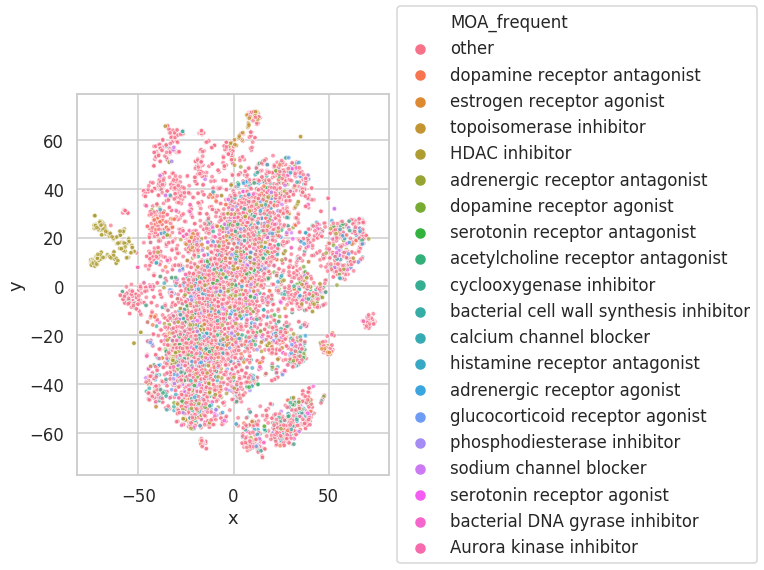

In [64]:
fig = plots.scatter_plot(sig_mat_tsne, sig_info_df_known_drugs, hue='MOA_frequent')

In [65]:
import umap

In [66]:
sig_mat_umap =  umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean').fit_transform(sig_mat)
sig_mat_umap.shape

(6285, 2)

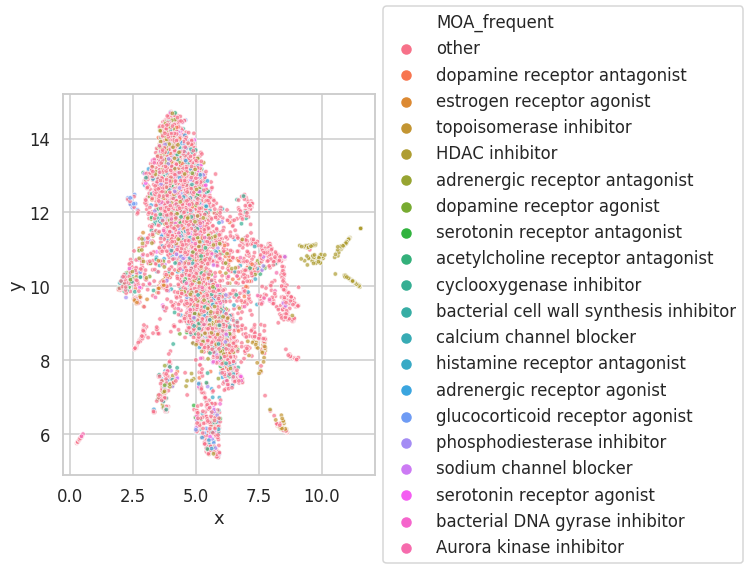

In [67]:
fig = plots.scatter_plot(sig_mat_umap, sig_info_df_known_drugs, hue='MOA_frequent')

In [68]:
plots.plotly_webgl_scatter(sig_mat_tsne, sig_info_df_known_drugs, 
                     hue='MOA_frequent', 
                     label_cols=['pert_iname', 'MOA'])

## 3.2. Graph-based dimensionality reduction for L1000 signatures 

**Workflow:**

1. Starts with $\mathbf{X}$ ($n \times m$ signatures by genes)
1. Compute pairwise distance/similarity matrix -> $\mathbf{A}$ ($n \times n$)
1. Construct a graph $G$ to represent the local and global geometric/topological structures of the data, the graph can be a k-Nearest Neighbor graph
1. Project $G$ into lower-dimensional space using graph layout algorithms, e.g., [Fruchterman-Reingold force-directed layout](https://onlinelibrary.wiley.com/doi/abs/10.1002/spe.4380211102), edge-repulsive strong clustering and others.


In [69]:
import graph_utils
import plots

In [70]:
sig_mat.shape

(6285, 978)

In [71]:
# Sample 1000 signatures for faster computation of the graph
sample_idx = np.random.choice(sig_mat.shape[0], 1000, replace=False)

sig_info_df_known_drugs_sample = sig_info_df_known_drugs.iloc[sample_idx]
G = graph_utils.create_knn_graph(sig_mat[sample_idx], k=8, n_jobs=6)
G.number_of_nodes(), G.number_of_edges()

(1000, 7713)

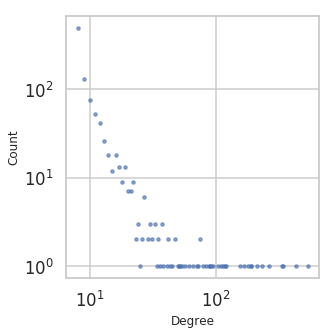

In [72]:
# Degree distribution of the graph
graph_utils.plot_degree_distribution(G);

In [73]:
# Convert to igraph.Graph
G = graph_utils.nx_graph_to_igraph(G)

In [74]:
# Perform Fruchterman-Reingold force-dirceted layout algorithm for the graph
layt = G.layout('fr', dim=3) 

In [75]:
frequent_MOAs = set(sig_info_df_known_drugs_sample['MOA'].value_counts()[:19].index)
sig_info_df_known_drugs_sample['MOA_frequent'] = [moa if moa in frequent_MOAs else 'other' \
                                           for moa in sig_info_df_known_drugs_sample['MOA']]

In [76]:
plots.plotly_network(G, layt, sig_info_df_known_drugs_sample,
                          hue='MOA_frequent',
                          label_cols=['pert_iname', 'MOA'])